<a href="https://colab.research.google.com/github/Ikeda33/codespaces-railstutorial/blob/main/vit_50epoch_flower_D_v_G_sa_FID_KID_devide_1_color_relativistic1_hinge.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#パッケージのダウンロード


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import argparse

In [4]:
import torch
import torch.nn as nn
import torch.optim as optim

In [5]:
import torchvision.transforms as transforms

In [6]:
import torchvision.datasets as dset

In [7]:
import torchvision.utils as vutils

In [8]:
import matplotlib.pyplot as plt
import numpy as np
import tqdm

In [9]:
import glob

In [10]:
from torch.utils.data import Dataset
from PIL import Image

In [11]:
from torch.utils.data import DataLoader
import torchvision

In [12]:
!pip install torchmetrics
!pip install torchmetrics[image]

!pip install torch-fidelity

from torchmetrics.image.inception import InceptionScore


import torchmetrics
import torch_fidelity

import torch
_ = torch.manual_seed(123)
from torchmetrics.image.fid import FrechetInceptionDistance
fid = FrechetInceptionDistance(feature=2048)

from torchmetrics.image.kid import KernelInceptionDistance


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 806.1/806.1 kB 7.2 MB/s eta 0:00:00


Downloading: "https://github.com/toshas/torch-fidelity/releases/download/v0.2.0/weights-inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/weights-inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:01<00:00, 73.7MB/s]


In [13]:
kid = KernelInceptionDistance(subset_size=15)

/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Metric `Kernel Inception Distance` will save all extracted features in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)  # noqa: B028


In [14]:
#ハイパーパラメータの設定

In [15]:
parser = argparse.ArgumentParser()
parser.add_argument("--n_epoch", type = int, default=50)
parser.add_argument("--batch_size", type = int, default=32)
parser.add_argument("--lr_g", type = float, default=2e-4)
parser.add_argument("--lr_d", type = float, default=3e-4)
parser.add_argument("--nch_g", type = int, default=64)
parser.add_argument("--nch_d", type = int, default=64)
parser.add_argument("--z_dim", type = int, default=100)
parser.add_argument("--beta1", type = float, default=0.5)

opt = parser.parse_args(args=[])
print(opt)

Namespace(n_epoch=50, batch_size=32, lr_g=0.0002, lr_d=0.0003, nch_g=64, nch_d=64, z_dim=100, beta1=0.5)


In [16]:
class ImageDataset(Dataset):
    def __init__(self,  transform = None):
        super().__init__()
        self.file_list = glob.glob("/content/drive/MyDrive/102flowers (2)/jpg/*.jpg")#/content/drive/MyDrive/img_align_celeba.zip
        #self.file_list = glob.glob("/content/drive/MyDrive/cityscapes/cityscapes_data/train/*.jpg" )#/content/drive/MyDrive/cityscapes/cityscapes_data/train
        #self.file_list = glob.glob("/content/drive/MyDrive/Test/**/*.jpg" )#fruits
       # self.file_list = glob.glob("/content/drive/MyDrive/img_align_celeba.zip/jpg/*.jpg")#C:\Users\ikeda\Downloads\img_align_celeba\img_align_celeba
        #self.file_list = glob.glob("/content/drive/MyDrive/–¢Šm”F 758452(1).crdownload/*.jpg")
        self.transform = transform


    def __getitem__(self, index):
        if self.transform is not None:
            img = self.transform(Image.open(self.file_list[index]))
        else:
            img = Image.open(self.file_list[index])
        return img

    def __len__(self):
        return len(self.file_list)

In [17]:
from torchvision.transforms.transforms import CenterCrop

transform = transforms.Compose([

    transforms.Resize(80),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
                               transforms.Normalize((0.5,),(0.5,))])

In [18]:
#dataset = dset.MNIST("./", train = True, download = True,transform = transform)
dataset = ImageDataset(transform = transform)
#dataset = torchvision.datasets.CelebA("./", split = "test", download = True,transform = transform) #Cityscapes
#dataset = torchvision.datasets.Cityscapes("C:\Users\ikeda\Downloads\cityscapes\cityscapes_data\cityscapes_data", split='train', mode='fine', target_type='color')


In [19]:
dataloader = DataLoader(dataset = dataset, batch_size = opt.batch_size,num_workers = 2,  shuffle = True)

In [20]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


In [21]:
#モデルの設定

In [22]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        out_channels = in_channels
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.se_block_0 = SE(out_channels)
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.conv1(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = x + self.shortcut(identity)
        return x

In [23]:
class ResidualBlock_G(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        out_channels = in_channels
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.se_block_0 = SE_G(out_channels)
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.conv1(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = x + self.shortcut(identity)
        return x

In [24]:
class ResidualBlock_1(nn.Module):#実質パディングとスペクトラム正規化とインスタンス正規化
  def __init__(self, in_channels):
    super().__init__()
    self.conv_layers = nn.Sequential(
        nn.ReflectionPad2d(1),
        nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, 3)),
        nn.InstanceNorm2d(in_channels),
        nn.ReLU(inplace = True),

        nn.ReflectionPad2d(1),
        nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, 3)),
        nn.InstanceNorm2d(in_channels),

    )
  def forward(self, x):
    out = self.conv_layers(x)
    out = out + x
    return out

In [25]:
class SelfAttention(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        n_divide = in_channels
        #out_channels = in_channels // n_divide
        out_channels = 1

        self.fx_1x1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        self.gx_1x1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        self.hx_1x1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2


    def forward(self, x):
        B, C, H, W = x.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(x).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(x).view(B, -1, H*W)
        hx = self.hx_1x1(x).view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o
        return out

In [26]:
#import torch
#from layers.transformer.ScaledDotProductAttention import ScaledDotProductAttention
#from torch import nn


class MultiHeadAttention(nn.Module):
    def __init__(self, in_channels, h = 8):
        super().__init__()
        d_model = in_channels
        self.d_model = in_channels
        self.h = in_channels
        self.d_k = d_model // h
        self.d_v = d_model // h
        self.fx_1x1 = (nn.Conv2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.gx_1x1 = (nn.Conv2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, kernel_size = 1))
        self.qkv = nn.utils.spectral_norm(nn.Conv2d(in_channels, 3 * in_channels, kernel_size = 1))

#        self.scaled_dot_product_attention = SelfAttention(self.d_model)

        self.linear = nn.Linear(self.h * self.d_v, d_model)
       # self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        #self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        #self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2

        self.se_block_0 = SE(in_channels)
        self.relu = nn.ReLU()

    def forward(self, x ) -> torch.Tensor:
        B, C, H, W = x.size()
        qkv = self.qkv(x)
        self.q, self.k, self.v = qkv.chunk(3, dim = 1)

        #self.q = self.se_block_0(self.q)
        #self.k = self.se_block_0(self.k)
        #self.v = self.se_block_0(self.v)

        """Scaled dot product attention"""
       # attention_output = self.scaled_dot_product_attention(self.q, self.k, self.v)  # (head*batch_size, seq_len, d_model)
        B, C, H, W = self.q.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(self.q).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(self.k).view(B, -1, H*W)
        hx = self.hx_1x1(self.v).view(B, -1, H*W)
       # fx = self.q.view(B, -1, H*W).permute(0,2,1)
       # gx = self.k.view(B, -1, H*W)
       # hx = self.v.view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o

        #out = out.repeat(1,self.h*1,1,1)

        #out = torch.chunk(out, self.h, dim=1)
       # out = torch.cat(out, dim=1)

        """Linear after scaled dot product attention"""
        #output = self.linear(out)
        return out


In [27]:

class MultiHeadAttention_G(nn.Module):
    def __init__(self, in_channels, h = 8):
        super().__init__()
        d_model = in_channels
        self.d_model = in_channels
        self.h = in_channels
        self.d_k = d_model // h
        self.d_v = d_model // h
        self.fx_1x1 = (nn.ConvTranspose2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.gx_1x1 = (nn.ConvTranspose2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels, kernel_size = 1))
        self.qkv = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, 3 * in_channels, kernel_size = 1))

#        self.scaled_dot_product_attention = SelfAttention(self.d_model)

        self.linear = nn.Linear(self.h * self.d_v, d_model)
       # self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        #self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        #self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2

        self.se_block_0 = SE_G(in_channels)
        self.relu = nn.ReLU()

    def forward(self, x ) -> torch.Tensor:
        B, C, H, W = x.size()
        qkv = self.qkv(x)
        qkv = self.relu(qkv)
        self.q, self.k, self.v = qkv.chunk(3, dim = 1)

        #self.q = self.se_block_0(self.q)
        #self.k = self.se_block_0(self.k)
        #self.v = self.se_block_0(self.v)
        """Scaled dot product attention"""
       # attention_output = self.scaled_dot_product_attention(self.q, self.k, self.v)  # (head*batch_size, seq_len, d_model)
        B, C, H, W = self.q.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(self.q).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(self.k).view(B, -1, H*W)
        hx = self.hx_1x1(self.v).view(B, -1, H*W)
       # fx = self.q.view(B, -1, H*W).permute(0,2,1)
       # gx = self.k.view(B, -1, H*W)
       # hx = self.v.view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o

        #out = out.repeat(1,self.h*1,1,1)

        #out = torch.chunk(out, self.h, dim=1)
       # out = torch.cat(out, dim=1)

        """Linear after scaled dot product attention"""
        #output = self.linear(out)
        return out

In [28]:
class SelfAttention_G(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        n_divide = in_channels
        out_channels = in_channels // n_divide
      #  out_channels = 1

        self.fx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size = 1))
        self.gx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels, kernel_size = 1))
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2


    def forward(self, x):
        B, C, H, W = x.size()
        fx = self.fx_1x1(x).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(x).view(B, -1, H*W)
        hx = self.hx_1x1(x).view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o
        return out

In [29]:
class PF(nn.Module):#poolformer
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.flat = nn.Flatten()
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.pool(x) -x
        x = x + identity

        identity = x#入力
        x = self.pre_bn(x)
        x= self.flat(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [30]:
"""    def __init__(self, in_channels):
        super().__init__()
        n_divide = 8
        out_channels = in_channels // n_divide
        self.dim = 3

        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size==1 -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool= nn.AvgPool2d(kernel_size =self.dim , stride = 1, padding = 0, count_include_pad=False)
        self.sigmoid = nn.Sigmoid()


    def forward(self, x):
        B, C, H, W = x.size()
        z = self.pre_bn(x)
        z = self.pool(z, self.dim = H)

        z = self.conv1(z)
        z = self.relu(z)

        z = self.conv2(z)
        z = self.sigmoid(z)

        z = torch.einsum("bchw,bchw->bchw",(x, z))
        out = x + self.gamma * z
        return out
"""

'    def __init__(self, in_channels):\n        super().__init__()\n        n_divide = 8\n        out_channels = in_channels // n_divide\n        self.dim = 3\n\n        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm\n        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#\n        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#\n        self.gamma = nn.Parameter(torch.zeros(1))\n        self.softmax = nn.Softmax(dim = -2)#規格化するため -2\n        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1\n        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))\n        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size==1 -> チャネル数だけ変化させること\n        self.pre_bn = nn.BatchNorm2d(in_channels)\n        self.bn = n

In [31]:
class SE(nn.Module):#SE_Block layerに対して作用するattentionのようなモデル
    def __init__(self, in_channels, reduction=24):
        super().__init__()
        channel = in_channels
        reduction = in_channels
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
           # nn.Linear(channel, channel// reduction , bias=False),
            (nn.Conv2d(in_channels, in_channels// reduction,kernel_size = 1, padding = 0)),
            nn.ReLU(inplace=True),
            #nn.Linear(channel // reduction, channel, bias=False),
            (nn.Conv2d(in_channels// reduction,in_channels,kernel_size = 1, padding = 0)),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        #y = self.avg_pool(x).view(b, c)
        y = self.avg_pool(x)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)




In [32]:
class SE_G(nn.Module):#SE_Block layerに対して作用するattentionのようなモデル
    def __init__(self, in_channels, reduction=24):
        super().__init__()
        channel = in_channels
        reduction = in_channels
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            #nn.Linear(channel, channel// reduction , bias=False),
            nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels// reduction,kernel_size = 1, padding = 0)),
            nn.ReLU(inplace=True),
            #nn.Linear(channel // reduction, channel, bias=False),
            nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels// reduction,in_channels,kernel_size = 1, padding = 0)),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)

In [33]:
#nn.ConvTranspose2d
class PF_G(nn.Module):#poolformer
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.flat = nn.Flatten()
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.pool(x) - x
        x = x + identity

        identity = x#入力
        x = self.pre_bn(x)
        x = self.flat(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [34]:
"""(((W - K + 2P)/S) + 1)
    Here W = Input size
    K = Filter size
    S = Stride
    P = Padding
    ((Input_size-kernel_size + 2*Padding)/stride)+ 1
    この式を使用できます[(W−K+2P)/S]+1。

W は入力ボリュームです - あなたの場合は 128
Kはカーネルサイズです - あなたの場合は5です
P はパディングです - あなたの場合は 0 だと思います
S はストライドです - あなたが提供していません。
したがって、次の式に入力します。
for example
Output_Shape = (128-5+0)/1+1

Output_Shape = (124,124,40)
output==1 ,1  = (W - k + 2p)/s = 0   s = 1, p = 0 ,k = W
    """



'(((W - K + 2P)/S) + 1)\n    Here W = Input size\n    K = Filter size\n    S = Stride\n    P = Padding\n    ((Input_size-kernel_size + 2*Padding)/stride)+ 1\n    この式を使用できます[(W−K+2P)/S]+1。\n\nW は入力ボリュームです - あなたの場合は 128\nKはカーネルサイズです - あなたの場合は5です\nP はパディングです - あなたの場合は 0 だと思います\nS はストライドです - あなたが提供していません。\nしたがって、次の式に入力します。\nfor example\nOutput_Shape = (128-5+0)/1+1\n\nOutput_Shape = (124,124,40)\noutput==1 ,1  = (W - k + 2p)/s = 0   s = 1, p = 0 ,k = W\n    '

In [35]:
class VIT(nn.Module):
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.pre_bn = nn.BatchNorm2d(in_channels)

        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(kernel_size = 3, stride = 1, padding = 3//2)
        self.attention = SelfAttention(in_channels)
        self.se_block_0 = SE(in_channels)
        self.se_block_1 = SE(out_channels)

        self.flat = nn.Flatten()

        self.linear_1 = nn.Linear(32,64, bias=False)
        self.linear_2 = nn.Linear( 32,32, bias=False)#if ( 64,32, bias=False)  -> mat1 and mat2 shapes cannot be multiplied (131072x32 and 64x32)


    def shortcut(self, x):
        x = self.conv3(x)
        #x = self.se_block_1(x)
        x = self.bn(x)
        return x

    def forward(self, x):

        identity = x#入力
        x = self.pre_bn(x)
       # x = self.se_block_0(x)
        x = self.attention(x) - x
        x = x + identity


        identity = x#入力
        x = self.pre_bn(x)
       # b, c, h, w = x.size()
        x = self.conv1(x)


      #  x = self.linear_1(x).view(b, -1, h, w)
        x = self.relu(x)
       # x = self.linear_2(x).view(b, -1, h, w)


        x =  self.shortcut(identity) + x
        #x = x + self.shortcut(identity)
        x = self.bn(x)

        return x

In [36]:
#nn.ConvTranspose2d
class VIT_G(nn.Module):
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size=1 -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.attention = MultiHeadAttention_G(in_channels)

    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.attention(x) - x
        x = x + identity

        #identity = x#入力
        x = self.pre_bn(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [37]:
class Generator(nn.Module):
    def __init__(self,pf, vit, resnet,res_net,sa,z_dim = opt.z_dim, ngf = opt.nch_g, nc = 3):# ものくろだからnc=1 カラーならnc=3
        super().__init__()

        self.convt1 = self.conv_trans_layers(z_dim, 8*ngf, 4,1,0 )# ngf = the number of channels

        self.convt2 = self.conv_trans_layers(8*ngf, 4*ngf, 4, 2, 1 )
        self.convt3 = self.conv_trans_layers(4*ngf,  2*ngf, 4,2,1)
        self.convt4 = self.conv_trans_layers(2*ngf,  ngf, 4,2,1 )

        self.pf1 = pf(z_dim, 8*ngf)
        self.vit1 = vit(z_dim, 8*ngf)

        self.pf2 = pf(8*ngf, 4*ngf)
        self.vit2 = vit(8*ngf, 4*ngf)

        self.pf3 = pf(4*ngf,  2*ngf)
        self.vit3 = vit(4*ngf,  2*ngf)

        self.pf4 = pf(2*ngf,  ngf)
        self.vit4 = vit(2*ngf,  ngf)

        self.convt5 = nn.Sequential(
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1),
            #self.conv_trans_layers(ngf, nc, 4,2,1  )
            nn.Tanh()
        )


    @staticmethod
    def conv_trans_layers(in_channels, out_channels, kernel_size, stride, padding, has_norm=True,attention=True, res_net= False, se = False):
        layers = [nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding))]#spectralnorm
        if has_norm:
            layers.append(nn.BatchNorm2d(out_channels))
        #layers.append(nn.ReLU(inplace = True))
        layers.append(nn.LeakyReLU(0.2, inplace = True))
        if se:
            layers.append(SE_G(out_channels))
        if attention:
            layers.append(SelfAttention_G(out_channels))
        if res_net:
            layers.append(ResidualBlock_G(out_channels))



        net = nn.Sequential(*layers)#listのアンパック

        return net

    def forward(self, x):
        out = self.convt1(x)

        out = self.convt2(out)

        out = self.convt3(out)

        out = self.convt4(out)

        out = self.convt5(out)


        return out

In [38]:
from pickle import FALSE
class Discriminator(nn.Module):
    def __init__(self,pf,vit ,resnet,res_net,sa,nc = 3, ndf = opt.nch_d):# ものくろだからnc=1 カラーならnc=3
        super().__init__()
        self.conv1 = self.conv_layers(nc, ndf)
        self.pf1 = pf(nc,ndf)
        self.vit1 = vit(nc,ndf)

        self.conv2 = self.conv_layers(ndf, 2*ndf )
        self.pf2 = pf(ndf, 2*ndf)
        self.vit2 = vit(ndf, 2*ndf)

        self.conv3 = self.conv_layers(2*ndf, 4*ndf )
        self.pf3 = pf(2*ndf, 4*ndf )
        self.vit3 = vit(2*ndf, 4*ndf )

        self.conv4 = self.conv_layers(4*ndf, 8*ndf)
        self.pf4 = pf(4*ndf, 8*ndf)
        self.vit4 = vit(4*ndf, 8*ndf)

        self.vit5 = vit(8*ndf, 16*ndf)

        self.conv5 =  nn.Conv2d(8*ndf, 1,  4)
        #self.conv6 =  nn.Conv2d(16*ndf, 1,  4)


    @staticmethod
    def conv_layers(in_channels, out_channels, kernel_size=4, stride=2, padding=1, has_batch_norm = True, attention = False, res_net = False, se = False):
        layers = [nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding))]
        if has_batch_norm:
            layers.append(nn.BatchNorm2d(out_channels))
        layers.append(nn.LeakyReLU(0.2, inplace = True))
        if se:
            layers.append(SE(out_channels))
        if attention:
            layers.append(SelfAttention(out_channels))

        if res_net:
            layers.append(ResidualBlock(out_channels))


        net = nn.Sequential(*layers)#listのアンパック

        return net

    def forward(self, x):
        out = self.conv1(x)

        out = self.vit2(out)

        out = self.vit3(out)

        out = self.vit4(out)

        out = self.conv5(out)

        return out

In [39]:
#モデルのトレーニング

In [40]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [41]:
device

device(type='cuda')

In [42]:
netG = Generator(PF_G,VIT_G,ResidualBlock,ResidualBlock_1,SelfAttention, z_dim=opt.z_dim , ngf=opt.nch_g ).to(device)
netG.apply(weights_init)
print(netG)

netD = Discriminator(PF,VIT,ResidualBlock,ResidualBlock_1,SelfAttention, nc = 3 , ndf=opt.nch_d ).to(device)# ものくろだからnc=1 カラーならnc=3
netD.apply(weights_init)
print(netD)

Generator(
  (convt1): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): SelfAttention_G(
      (fx_1x1): ConvTranspose2d(512, 1, kernel_size=(1, 1), stride=(1, 1))
      (gx_1x1): ConvTranspose2d(512, 1, kernel_size=(1, 1), stride=(1, 1))
      (hx_1x1): ConvTranspose2d(512, 512, kernel_size=(1, 1), stride=(1, 1))
      (softmax): Softmax(dim=-2)
    )
  )
  (convt2): Sequential(
    (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): SelfAttention_G(
      (fx_1x1): ConvTranspose2d(256, 1, kernel_size=(1, 1), stride=(1, 1))
      (gx_1x1): ConvTranspose2d(256, 1, kernel_size=(1, 1), stride=(1, 1))
      (hx_1x1): ConvTranspo

In [43]:
#criterion = nn.BCELoss()
#criterion = torch.nn.HingeEmbeddingLoss()
optimizerG = optim.Adam(netG.parameters(), lr = opt.lr_g, betas= (opt.beta1, 0.999), weight_decay = 1e-5)
optimizerD = optim.Adam(netD.parameters(), lr = opt.lr_d, betas= (opt.beta1, 0.999), weight_decay = 1e-5)

100%|██████████| 103/103 [02:09<00:00,  1.26s/it]


epoch: 0, lossD:1.2849003898287283, lossG:4.584019714188807,lossG_fake:2.1596728204523474, lossG_real:2.424346928457612 ,equality:-0.2646741080052646


evaluate:156.67587280273438,kid_mean:0.12919646501541138, kid_std:0.020607255399227142,kid_:(tensor(0.1292), tensor(0.0206))


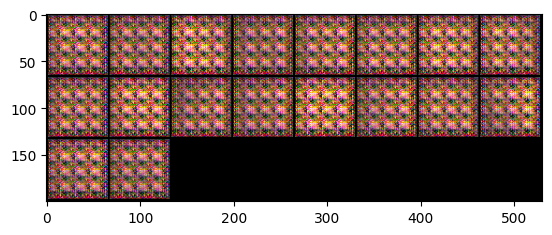

100%|██████████| 103/103 [00:58<00:00,  1.77it/s]


epoch: 1, lossD:1.2398531529509906, lossG:3.930230027263604,lossG_fake:2.132938162794391, lossG_real:1.7972918679413286 ,equality:0.3356462948530625


evaluate:125.95032501220703,kid_mean:0.06942262500524521, kid_std:0.028043728321790695,kid_:(tensor(0.0694), tensor(0.0280))


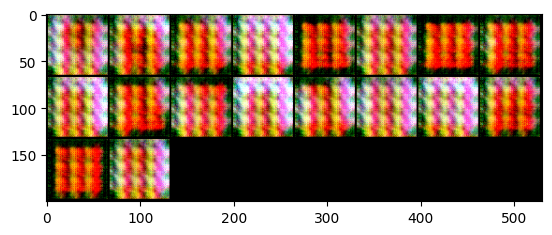

100%|██████████| 103/103 [00:59<00:00,  1.74it/s]


epoch: 2, lossD:1.6662873203314623, lossG:2.8046602508396776,lossG_fake:1.5619360011758157, lossG_real:1.2427242456130612 ,equality:0.3192117555627545


evaluate:116.25694274902344,kid_mean:0.06966418772935867, kid_std:0.030678031966090202,kid_:(tensor(0.0697), tensor(0.0307))


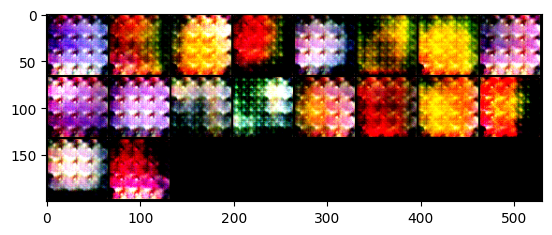

100%|██████████| 103/103 [01:00<00:00,  1.71it/s]


epoch: 3, lossD:1.6921478972851651, lossG:2.666116441337808,lossG_fake:1.4367715293921313, lossG_real:1.229344922362022 ,equality:0.20742660703010918


evaluate:108.8340072631836,kid_mean:0.06170789897441864, kid_std:0.033272020518779755,kid_:(tensor(0.0617), tensor(0.0333))


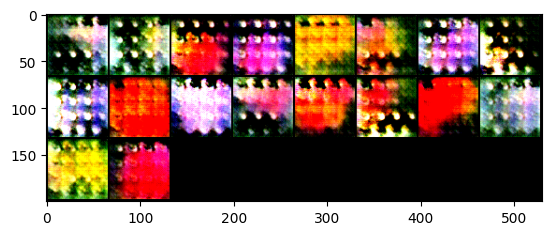

100%|██████████| 103/103 [01:00<00:00,  1.69it/s]


epoch: 4, lossD:1.719998174500697, lossG:2.662851310470729,lossG_fake:1.4468265065869081, lossG_real:1.2160248102493656 ,equality:0.23080169633754255


evaluate:115.01510620117188,kid_mean:0.06391773372888565, kid_std:0.030884098261594772,kid_:(tensor(0.0639), tensor(0.0309))


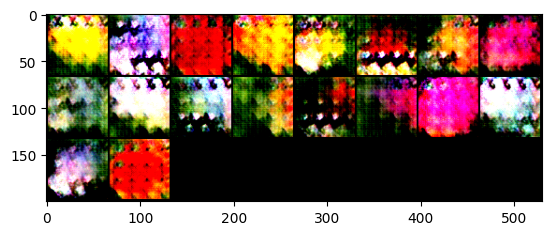

100%|██████████| 103/103 [01:01<00:00,  1.68it/s]


epoch: 5, lossD:1.7446993045436525, lossG:2.5728251748872033,lossG_fake:1.386445602167, lossG_real:1.18637957040546 ,equality:0.20006603176153992


evaluate:110.74392700195312,kid_mean:0.06606248021125793, kid_std:0.031093595549464226,kid_:(tensor(0.0661), tensor(0.0311))


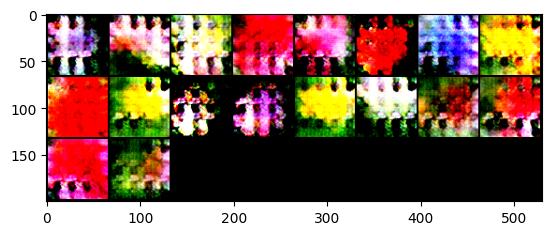

100%|██████████| 103/103 [01:01<00:00,  1.67it/s]


epoch: 6, lossD:1.694057043316295, lossG:2.662781722337297,lossG_fake:1.4106897850638453, lossG_real:1.252091925699734 ,equality:0.1585978593641113


evaluate:116.08815002441406,kid_mean:0.07371734082698822, kid_std:0.032916855067014694,kid_:(tensor(0.0737), tensor(0.0329))


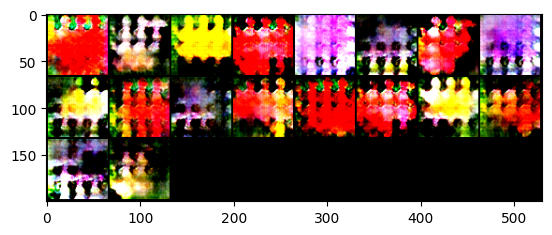

100%|██████████| 103/103 [01:01<00:00,  1.67it/s]


epoch: 7, lossD:1.7043841903649488, lossG:2.733361633078566,lossG_fake:1.4312298060620872, lossG_real:1.3021318270164786 ,equality:0.1290979790456086


evaluate:111.6297378540039,kid_mean:0.06591933965682983, kid_std:0.03527417406439781,kid_:(tensor(0.0659), tensor(0.0353))


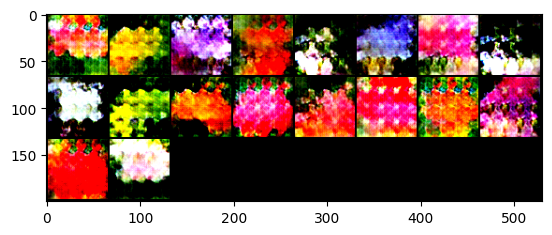

100%|██████████| 103/103 [01:01<00:00,  1.67it/s]


epoch: 8, lossD:1.7184321336375856, lossG:2.6739240456553337,lossG_fake:1.4236981799301591, lossG_real:1.2502258836644367 ,equality:0.17347229626572247


evaluate:116.51792907714844,kid_mean:0.06882435083389282, kid_std:0.036970604211091995,kid_:(tensor(0.0688), tensor(0.0370))


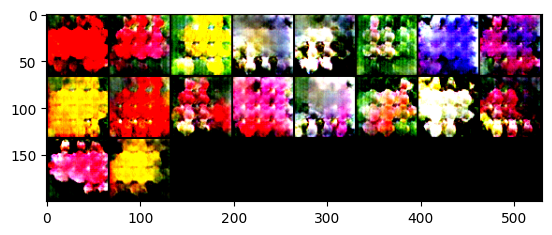

100%|██████████| 103/103 [01:01<00:00,  1.67it/s]


epoch: 9, lossD:1.708858045559485, lossG:2.6812183833816676,lossG_fake:1.428149767292356, lossG_real:1.2530686259269714 ,equality:0.17508114136538455


evaluate:118.82976531982422,kid_mean:0.0716615840792656, kid_std:0.04186428338289261,kid_:(tensor(0.0717), tensor(0.0419))


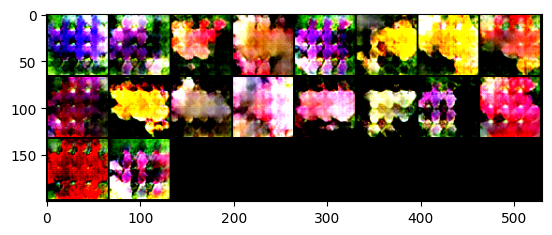

100%|██████████| 103/103 [01:01<00:00,  1.66it/s]


epoch: 10, lossD:1.7857273527719442, lossG:2.6622351766790002,lossG_fake:1.4142465765036425, lossG_real:1.2479885984393 ,equality:0.1662579780643425


evaluate:124.05475616455078,kid_mean:0.07466556131839752, kid_std:0.04028046503663063,kid_:(tensor(0.0747), tensor(0.0403))


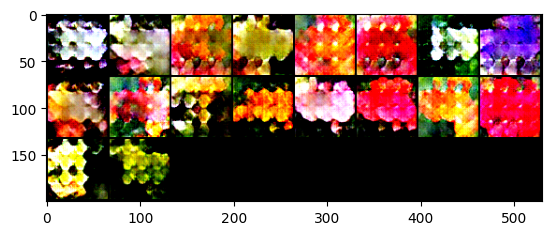

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 11, lossD:1.6938975111952106, lossG:2.726294647142725,lossG_fake:1.446804823227299, lossG_real:1.2794898320170283 ,equality:0.1673149912102707


evaluate:122.7101821899414,kid_mean:0.08156557381153107, kid_std:0.03655639663338661,kid_:(tensor(0.0816), tensor(0.0366))


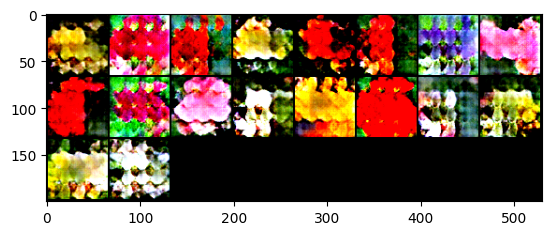

100%|██████████| 103/103 [01:01<00:00,  1.66it/s]


epoch: 12, lossD:1.6943722141599191, lossG:2.75081422490981,lossG_fake:1.4554691818153973, lossG_real:1.2953450396222976 ,equality:0.16012414219309967


evaluate:123.95752716064453,kid_mean:0.07804731279611588, kid_std:0.03796019032597542,kid_:(tensor(0.0780), tensor(0.0380))


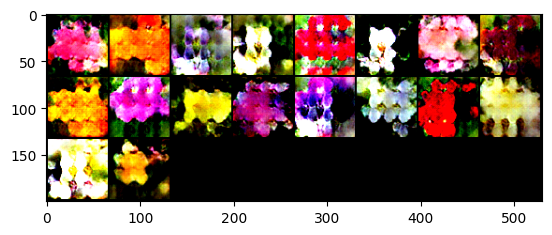

100%|██████████| 103/103 [01:01<00:00,  1.66it/s]


epoch: 13, lossD:1.6822453945585825, lossG:2.7834259838733857,lossG_fake:1.4649054946251285, lossG_real:1.3185204973498594 ,equality:0.1463849972752691


evaluate:122.3231430053711,kid_mean:0.07877643406391144, kid_std:0.03843900188803673,kid_:(tensor(0.0788), tensor(0.0384))


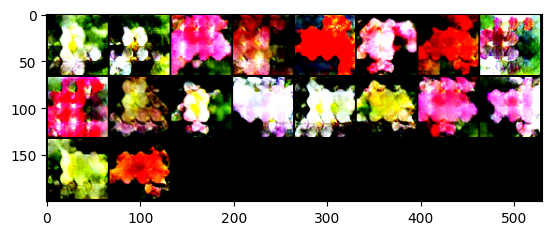

100%|██████████| 103/103 [01:01<00:00,  1.66it/s]


epoch: 14, lossD:1.6402664138275442, lossG:2.866825643094998,lossG_fake:1.5196272157928319, lossG_real:1.3471984301955955 ,equality:0.1724287855972364


evaluate:123.2508544921875,kid_mean:0.07264834642410278, kid_std:0.04379940405488014,kid_:(tensor(0.0726), tensor(0.0438))


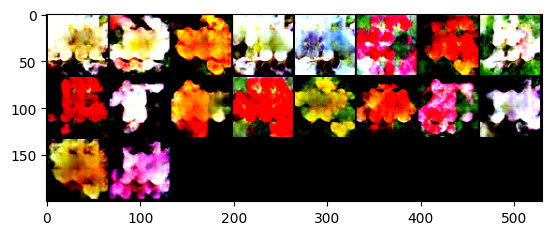

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 15, lossD:1.6197422708122475, lossG:2.889697162850389,lossG_fake:1.5097291683687748, lossG_real:1.379968000268473 ,equality:0.1297611681003017


evaluate:123.7924575805664,kid_mean:0.074684277176857, kid_std:0.03882647305727005,kid_:(tensor(0.0747), tensor(0.0388))


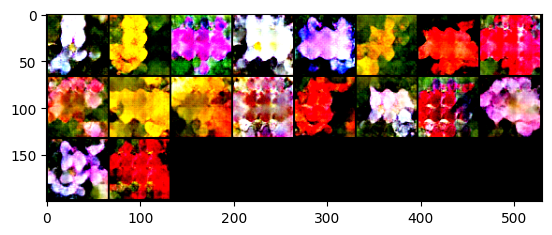

100%|██████████| 103/103 [01:01<00:00,  1.66it/s]


epoch: 16, lossD:1.5847107947451398, lossG:2.9972150557249497,lossG_fake:1.5832446998762852, lossG_real:1.413970357006036 ,equality:0.16927434287024923


evaluate:122.05979919433594,kid_mean:0.07163895666599274, kid_std:0.036208026111125946,kid_:(tensor(0.0716), tensor(0.0362))


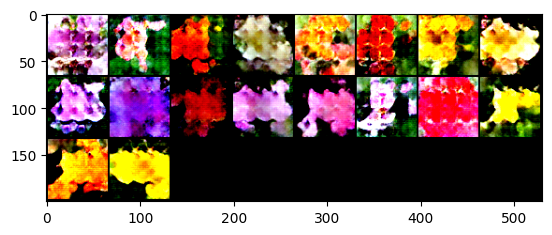

100%|██████████| 103/103 [01:01<00:00,  1.66it/s]


epoch: 17, lossD:1.5432115399721757, lossG:3.0610872611258793,lossG_fake:1.605096174675284, lossG_real:1.4559910835571659 ,equality:0.1491050911181182


evaluate:123.68904876708984,kid_mean:0.07491080462932587, kid_std:0.04000783711671829,kid_:(tensor(0.0749), tensor(0.0400))


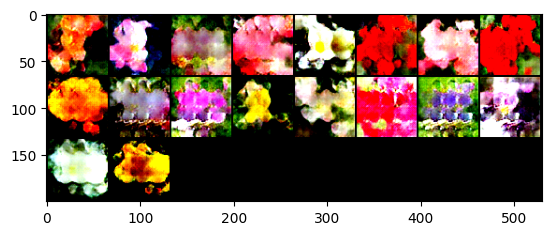

100%|██████████| 103/103 [01:01<00:00,  1.66it/s]


epoch: 18, lossD:1.5104585747116979, lossG:3.174745427752004,lossG_fake:1.6700919212646854, lossG_real:1.5046535033045463 ,equality:0.16543841796013914


evaluate:121.6099853515625,kid_mean:0.07925383746623993, kid_std:0.03871900215744972,kid_:(tensor(0.0793), tensor(0.0387))


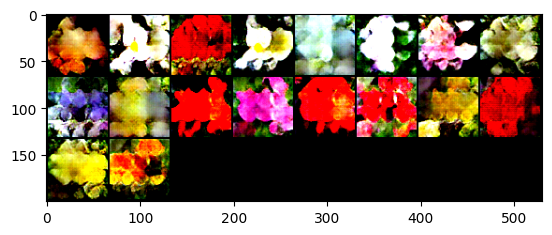

100%|██████████| 103/103 [01:01<00:00,  1.66it/s]


epoch: 19, lossD:1.4488191164812996, lossG:3.2438526037827278,lossG_fake:1.7052490618622418, lossG_real:1.5386035491540595 ,equality:0.1666455127081823


evaluate:121.24861145019531,kid_mean:0.07527075707912445, kid_std:0.04111533239483833,kid_:(tensor(0.0753), tensor(0.0411))


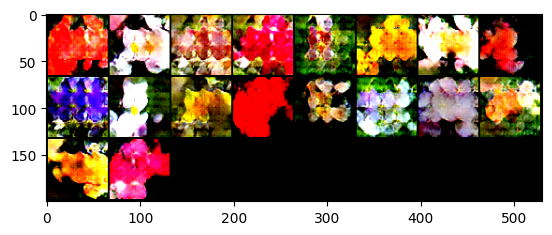

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 20, lossD:1.372928441149517, lossG:3.4010470955117236,lossG_fake:1.7915839147799224, lossG_real:1.6094631801531152 ,equality:0.18212073462680722


evaluate:120.36021423339844,kid_mean:0.07452133297920227, kid_std:0.038665201514959335,kid_:(tensor(0.0745), tensor(0.0387))


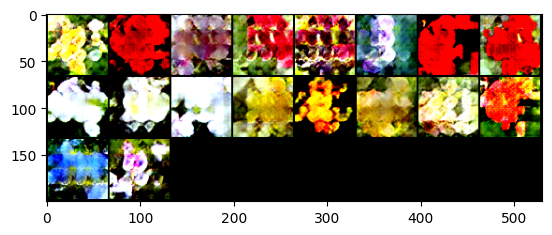

100%|██████████| 103/103 [01:01<00:00,  1.66it/s]


epoch: 21, lossD:1.292102399960305, lossG:3.5333860892693973,lossG_fake:1.860595365751137, lossG_real:1.6727907188887734 ,equality:0.18780464686236353


evaluate:120.20267486572266,kid_mean:0.07397464662790298, kid_std:0.038676198571920395,kid_:(tensor(0.0740), tensor(0.0387))


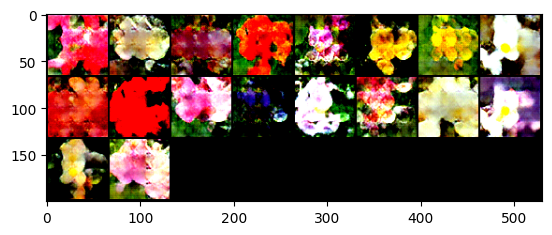

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 22, lossD:1.238225316538394, lossG:3.668151989723872,lossG_fake:1.9113566024789532, lossG_real:1.7567953927424347 ,equality:0.15456120973651855


evaluate:118.63340759277344,kid_mean:0.07337353378534317, kid_std:0.03532090038061142,kid_:(tensor(0.0734), tensor(0.0353))


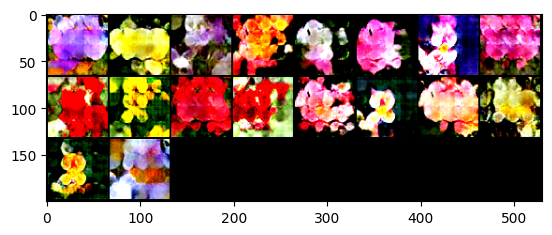

100%|██████████| 103/103 [01:01<00:00,  1.66it/s]


epoch: 23, lossD:1.2126624323789357, lossG:3.7171208164066942,lossG_fake:1.948627837653299, lossG_real:1.768492981068139 ,equality:0.18013485658516015


evaluate:116.95281982421875,kid_mean:0.08143738657236099, kid_std:0.04047803953289986,kid_:(tensor(0.0814), tensor(0.0405))


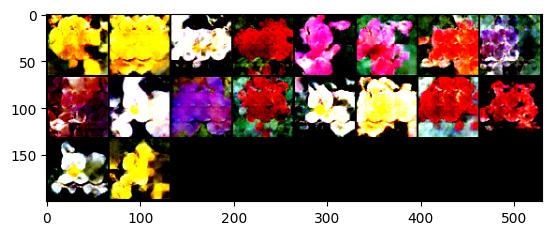

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 24, lossD:1.1500113727976975, lossG:3.763713651490443,lossG_fake:1.9826708974190128, lossG_real:1.7810427610156605 ,equality:0.2016281364033523


evaluate:118.19198608398438,kid_mean:0.07176291197538376, kid_std:0.039493344724178314,kid_:(tensor(0.0718), tensor(0.0395))


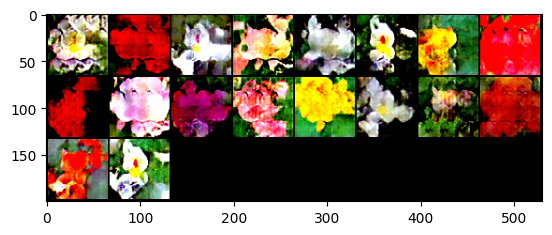

100%|██████████| 103/103 [01:01<00:00,  1.66it/s]


epoch: 25, lossD:1.1084262456708742, lossG:3.9174429953676984,lossG_fake:2.0263489693113903, lossG_real:1.8910940194014207 ,equality:0.13525494990996956


evaluate:120.37855529785156,kid_mean:0.07612930983304977, kid_std:0.03747961297631264,kid_:(tensor(0.0761), tensor(0.0375))


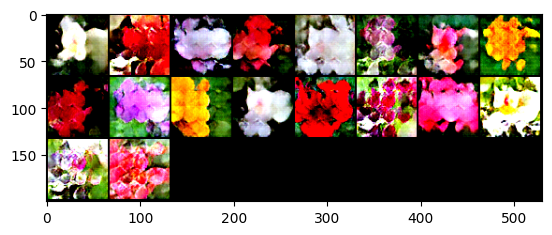

100%|██████████| 103/103 [01:01<00:00,  1.66it/s]


epoch: 26, lossD:1.0840477905805828, lossG:4.028579825336493,lossG_fake:2.069160512350138, lossG_real:1.9594193291895599 ,equality:0.10974118316057813


evaluate:120.75377655029297,kid_mean:0.07999879866838455, kid_std:0.039394304156303406,kid_:(tensor(0.0800), tensor(0.0394))


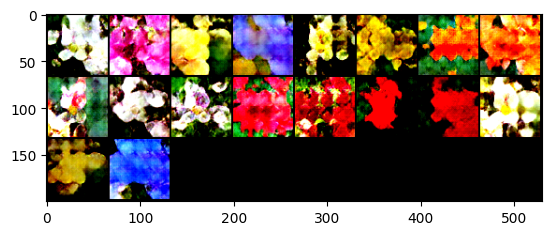

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 27, lossD:0.9192818411924306, lossG:4.256574672402688,lossG_fake:2.198201232164809, lossG_real:2.058373441973936 ,equality:0.13982779019087266


evaluate:120.19847869873047,kid_mean:0.07168316841125488, kid_std:0.03580857068300247,kid_:(tensor(0.0717), tensor(0.0358))


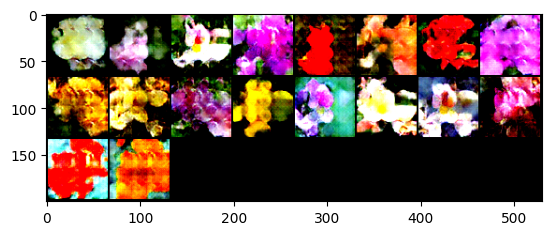

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 28, lossD:0.887094133108565, lossG:4.447581652298714,lossG_fake:2.2884459310364953, lossG_real:2.159135713160617 ,equality:0.12931021787587849


evaluate:122.50293731689453,kid_mean:0.0745326429605484, kid_std:0.03687211871147156,kid_:(tensor(0.0745), tensor(0.0369))


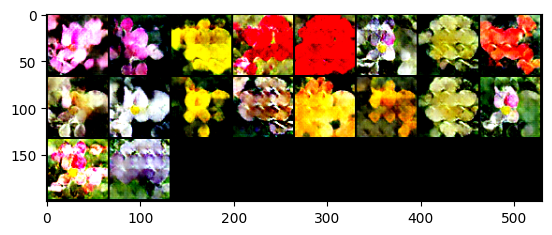

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 29, lossD:0.8329377420318936, lossG:4.481741196900895,lossG_fake:2.329505989273775, lossG_real:2.1522352108098928 ,equality:0.17727077846388228


evaluate:122.84664154052734,kid_mean:0.08307701349258423, kid_std:0.04382598027586937,kid_:(tensor(0.0831), tensor(0.0438))


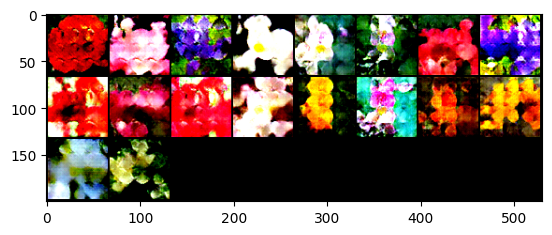

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 30, lossD:0.7447266730579357, lossG:4.648904587458638,lossG_fake:2.3944149017333984, lossG_real:2.2544896955628997 ,equality:0.13992520617049875


evaluate:123.01885223388672,kid_mean:0.07535140216350555, kid_std:0.03672776743769646,kid_:(tensor(0.0754), tensor(0.0367))


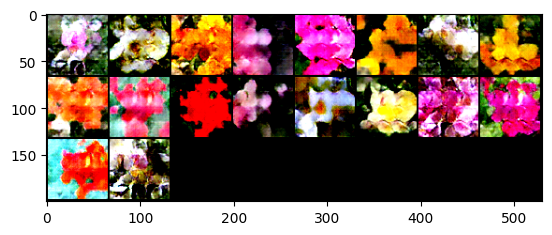

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 31, lossD:0.6909060685090649, lossG:4.889163864469065,lossG_fake:2.4668050894459475, lossG_real:2.4223587941197517 ,equality:0.044446295326195706


evaluate:123.1361312866211,kid_mean:0.08099552243947983, kid_std:0.03877687081694603,kid_:(tensor(0.0810), tensor(0.0388))


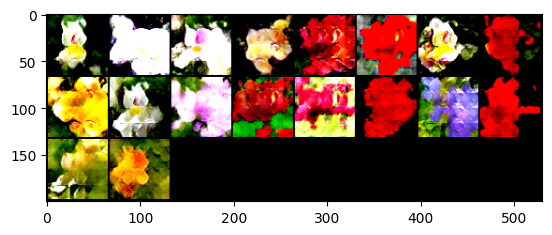

100%|██████████| 103/103 [01:01<00:00,  1.66it/s]


epoch: 32, lossD:0.6858515574515445, lossG:4.895567065303766,lossG_fake:2.4767305437222267, lossG_real:2.418836537206057 ,equality:0.057894006516169494


evaluate:122.62578582763672,kid_mean:0.07270684838294983, kid_std:0.03698866441845894,kid_:(tensor(0.0727), tensor(0.0370))


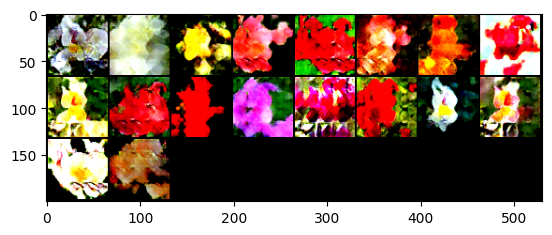

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 33, lossD:0.673862772008169, lossG:4.993527310565837,lossG_fake:2.513504436872538, lossG_real:2.480022870510527 ,equality:0.03348156636201072


evaluate:123.31571197509766,kid_mean:0.07821264863014221, kid_std:0.04354023560881615,kid_:(tensor(0.0782), tensor(0.0435))


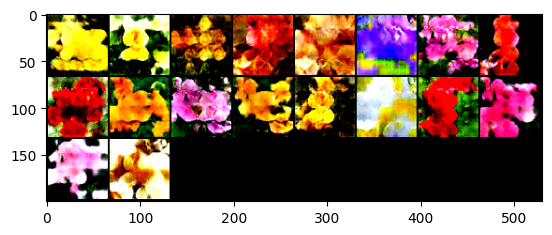

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 34, lossD:0.5683559474435825, lossG:5.227005310428953,lossG_fake:2.6585797181407225, lossG_real:2.5684255902628297 ,equality:0.09015412787789279


evaluate:123.25170135498047,kid_mean:0.08698228001594543, kid_std:0.04026917368173599,kid_:(tensor(0.0870), tensor(0.0403))


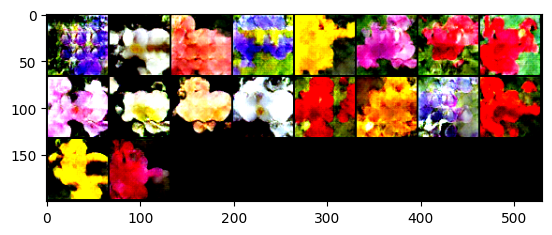

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 35, lossD:0.6727734781729365, lossG:5.154224680465402,lossG_fake:2.6362884232720125, lossG_real:2.517936242726243 ,equality:0.11835218054576968


evaluate:122.16946411132812,kid_mean:0.07305271923542023, kid_std:0.04115996137261391,kid_:(tensor(0.0731), tensor(0.0412))


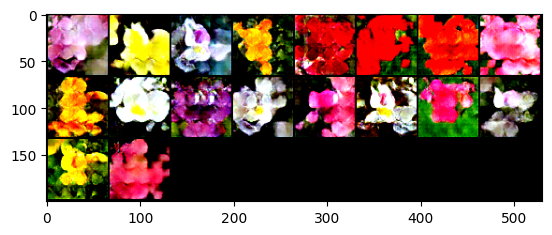

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 36, lossD:0.4836183525621891, lossG:5.453954224447602,lossG_fake:2.7261904914980954, lossG_real:2.727763728609363 ,equality:-0.0015732371112675558


evaluate:122.38450622558594,kid_mean:0.08079228550195694, kid_std:0.04245191439986229,kid_:(tensor(0.0808), tensor(0.0425))


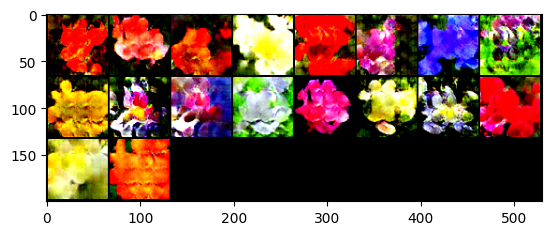

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 37, lossD:0.5272592443032461, lossG:5.410128422153806,lossG_fake:2.776482791287228, lossG_real:2.633645642150953 ,equality:0.142837149136275


evaluate:121.88665008544922,kid_mean:0.08134140074253082, kid_std:0.04054563120007515,kid_:(tensor(0.0813), tensor(0.0405))


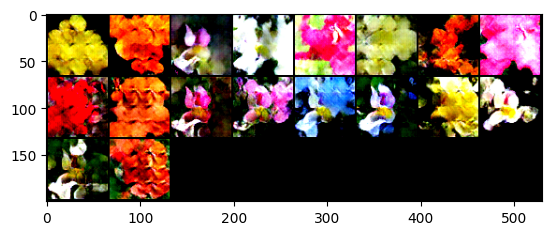

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 38, lossD:0.6346906381614, lossG:5.374182492783926,lossG_fake:2.742754458223732, lossG_real:2.6314280157529035 ,equality:0.11132644247082846


evaluate:123.04302978515625,kid_mean:0.07949092239141464, kid_std:0.03533565253019333,kid_:(tensor(0.0795), tensor(0.0353))


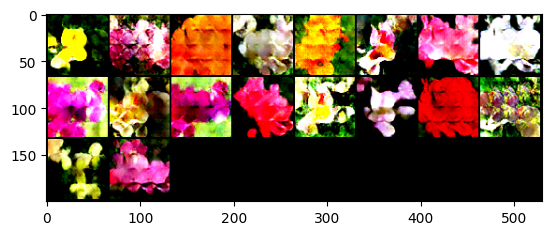

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 39, lossD:0.45473623336338015, lossG:5.5960034213019805,lossG_fake:2.8252548043010304, lossG_real:2.7707486418844427 ,equality:0.05450616241658768


evaluate:122.8446273803711,kid_mean:0.07840157300233841, kid_std:0.041010938584804535,kid_:(tensor(0.0784), tensor(0.0410))


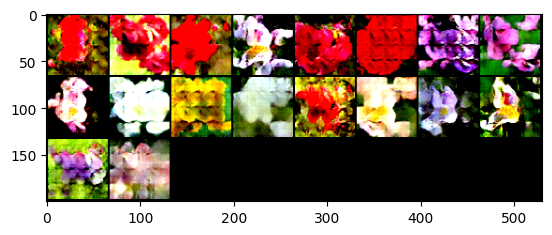

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 40, lossD:0.608890224212003, lossG:5.504944069871625,lossG_fake:2.8130755728309595, lossG_real:2.691868479969432 ,equality:0.12120709286152742


evaluate:122.37709045410156,kid_mean:0.08045446127653122, kid_std:0.04132058098912239,kid_:(tensor(0.0805), tensor(0.0413))


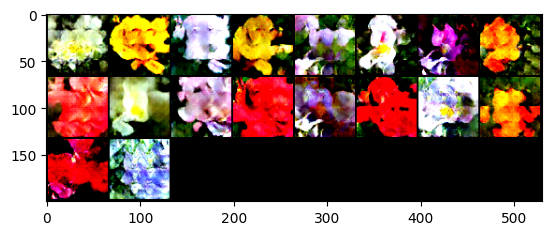

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 41, lossD:0.4422043157216993, lossG:5.619601013590988,lossG_fake:2.836953757457363, lossG_real:2.7826472836212046 ,equality:0.054306473836158276


evaluate:122.27025604248047,kid_mean:0.08452029526233673, kid_std:0.04189431667327881,kid_:(tensor(0.0845), tensor(0.0419))


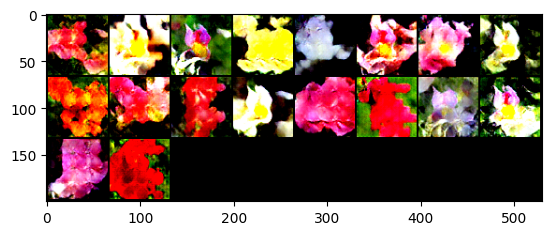

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 42, lossD:0.39399027057643077, lossG:5.879098919988836,lossG_fake:2.95401379089911, lossG_real:2.9250851302470977 ,equality:0.028928660652012272


evaluate:122.02081298828125,kid_mean:0.0746026411652565, kid_std:0.03512205928564072,kid_:(tensor(0.0746), tensor(0.0351))


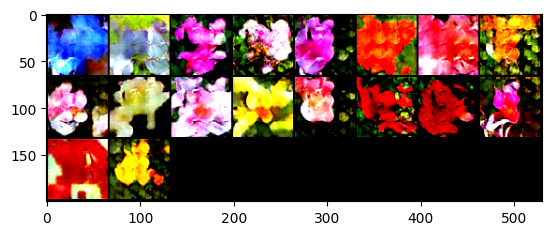

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 43, lossD:0.5075490535643784, lossG:5.89793626544545,lossG_fake:3.012369655000353, lossG_real:2.885566622018814 ,equality:0.12680303298153905


evaluate:122.06558990478516,kid_mean:0.08198226988315582, kid_std:0.04461406543850899,kid_:(tensor(0.0820), tensor(0.0446))


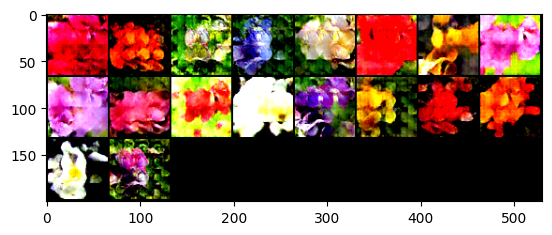

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 44, lossD:0.46343306730076383, lossG:5.9238403607340695,lossG_fake:2.9517307570837077, lossG_real:2.9721095967061313 ,equality:-0.020378839622423595


evaluate:122.41278839111328,kid_mean:0.07471909373998642, kid_std:0.04190723970532417,kid_:(tensor(0.0747), tensor(0.0419))


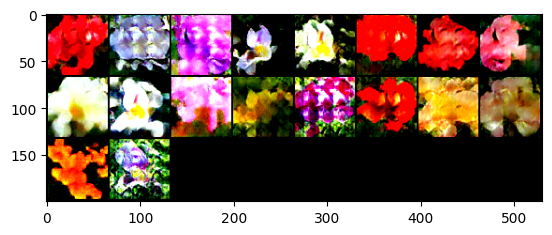

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 45, lossD:0.3514511631304416, lossG:6.214485561963424,lossG_fake:3.1865552241362414, lossG_real:3.027930326832151 ,equality:0.15862489730409024


evaluate:122.25430297851562,kid_mean:0.0828625038266182, kid_std:0.0469384640455246,kid_:(tensor(0.0829), tensor(0.0469))


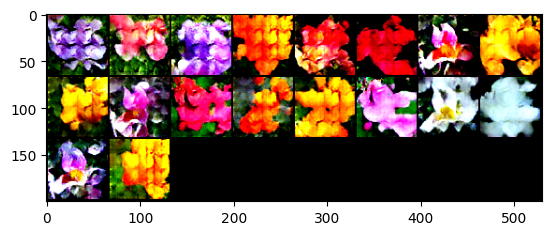

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 46, lossD:0.49880333459999376, lossG:6.045110591406961,lossG_fake:3.0758841850803895, lossG_real:2.9692264019864276 ,equality:0.1066577830939619


evaluate:121.8462905883789,kid_mean:0.08164088428020477, kid_std:0.04263576865196228,kid_:(tensor(0.0816), tensor(0.0426))


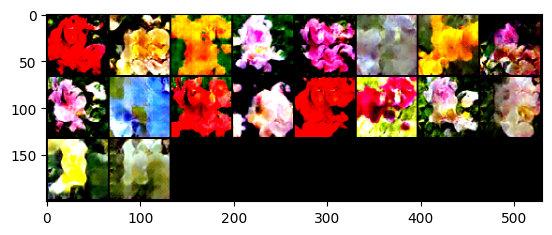

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 47, lossD:0.3966143341029732, lossG:6.0043147605599705,lossG_fake:2.978645019450234, lossG_real:3.0256697344548495 ,equality:-0.04702471500461547


evaluate:121.3963394165039,kid_mean:0.07438974827528, kid_std:0.039043668657541275,kid_:(tensor(0.0744), tensor(0.0390))


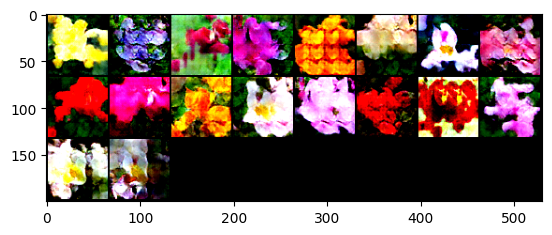

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 48, lossD:0.3308121963286573, lossG:6.268562312265044,lossG_fake:3.178977032309597, lossG_real:3.0895852753259603 ,equality:0.08939175698363666


evaluate:121.27127838134766,kid_mean:0.07605495303869247, kid_std:0.04104522615671158,kid_:(tensor(0.0761), tensor(0.0410))


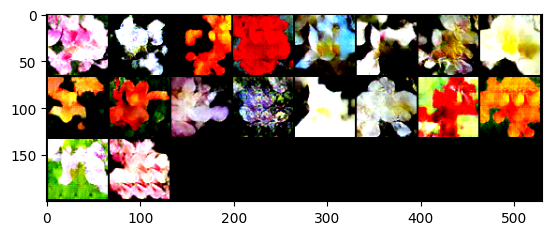

100%|██████████| 103/103 [01:02<00:00,  1.66it/s]


epoch: 49, lossD:0.39301452649874813, lossG:6.524449380856116,lossG_fake:3.3184205345737126, lossG_real:3.206028848307804 ,equality:0.11239168626590867


evaluate:120.39714050292969,kid_mean:0.08141649514436722, kid_std:0.047510016709566116,kid_:(tensor(0.0814), tensor(0.0475))


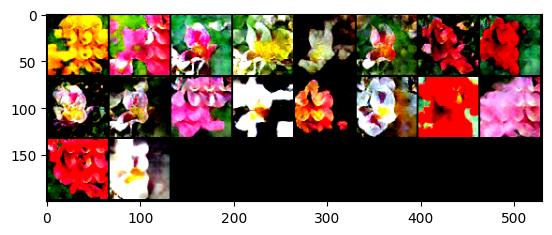

In [44]:
lossesD = []
lossesG = []

raw_lossesD = []
raw_lossesG = []
lossesG_fake = []
lossesG_real = []

equality = 0.0
sum_equality = 0.0
d_equality = []

relu = torch.nn.ReLU()

fid_ = []
kid_mean_ = []
kid_std_ = []
kid_score = []
for epoch in range(opt.n_epoch):
    running_lossD = 0.0 #損失関数初期化
    running_lossG = 0.0
    lossG_fake_running = 0.0
    lossG_real_running = 0.0

    #sum_equality += equality
    equality = 0.0
   # for i , (real_imgs, _) in enumerate(tqdm.tqdm(dataloader, position = 0)):#celebA
    for i , real_imgs in enumerate(tqdm.tqdm(dataloader, position = 0)):#flower
        real_imgs = real_imgs.to(device)
        batch_size = real_imgs.size()[0]
        noise = torch.randn(batch_size, opt.z_dim, 1, 1).to(device)

        #train discriminator

        netD.zero_grad()
        output_real = netD(real_imgs)

        #lossD_real = criterion(output, labels_real)
        lossD_real = torch.mean(relu(1.0 - output_real))


        fake_imgs = netG(noise)##not train  output_fake_d
        output_fake_d = netD(fake_imgs.detach())#not train  output_fake_d

        #lossD_fake = criterion(output, labels_fake)
        lossD_fake = torch.mean(relu(1.0 + output_fake_d))


        lossD = lossD_real + lossD_fake
        #lossD = torch.mean(torch.log(torch.sigmoid(output_real)))- torch.mean(torch.log(torch.sigmoid(output_fake_d)))  #not train  output_fake_d
        lossD.backward()
        optimizerD.step()

        #train generator

        netG.zero_grad()#勾配初期

        output_fake_g = netD(fake_imgs)#train  output_fake_g
        output_real = netD(real_imgs)

        lossG_fake = torch.mean(relu(1.0 - output_fake_g))
        lossG_real = torch.mean(relu(1.0 + output_real))
        #lossG =  torch.mean(torch.log(torch.sigmoid(output_fake_g - output_real))) #- torch.mean(torch.log(torch.sigmoid(output_real)))#train  output_fake_g
        lossG =    lossG_real + lossG_fake


        lossG.backward()
        optimizerG.step()

        # save loss

        running_lossD += lossD.item()
        running_lossG += lossG.item()

        raw_lossesD.append(lossD.item())
        raw_lossesG.append(lossG.item())

        lossG_fake_running += lossG_fake.item()
        lossG_real_running += lossG_real.item()



    running_lossD /=len(dataloader)
    running_lossG /=len(dataloader)

    lossG_fake_running /= len(dataloader)
    lossG_real_running /= len(dataloader)
#equality
    equality = ( lossG_fake_running - lossG_real_running  )
    d_equality.append(equality)


    print("epoch: {}, lossD:{}, lossG:{},lossG_fake:{}, lossG_real:{} ,equality:{}".format(epoch, running_lossD, running_lossG,lossG_fake_running,lossG_real_running,equality))#-->,lossG_fake:{}, lossG_real:{},lossG_fake_running,lossG_real_running
    lossesD.append(running_lossD)
    lossesG.append(running_lossG)

    lossesG_fake.append(lossG_fake_running)
    lossesG_real.append(lossG_real_running)

     #evaluate GAN
    fake_imgs_1 = fake_imgs.detach()
    real_imgs_1 = real_imgs.to(dtype=torch.uint8).cpu()
    fake_imgs_1 = fake_imgs_1.to(dtype=torch.uint8).cpu()
    fid.update(real_imgs_1, real=True)
    fid.update(fake_imgs_1, real=False)
    eval = fid.compute()

    kid.update(real_imgs_1, real=True)
    kid.update(fake_imgs_1, real=False)
    kid_ = kid.compute()
    kid_mean, kid_std = kid.compute()



    print("evaluate:{},kid_mean:{}, kid_std:{},kid_:{}".format(eval, kid_mean, kid_std, kid_))
    fid_.append(eval)
    kid_mean_.append(kid_mean)
    kid_std_.append(kid_std)
    kid_score.append(kid_)
    #show fake image
    grid_imgs = vutils.make_grid(fake_imgs[:24].detach()+0.5)
    grid_imgs_arr = grid_imgs.cpu().numpy()
    plt.imshow(np.transpose(grid_imgs_arr, (1,2,0)))
    plt.show()

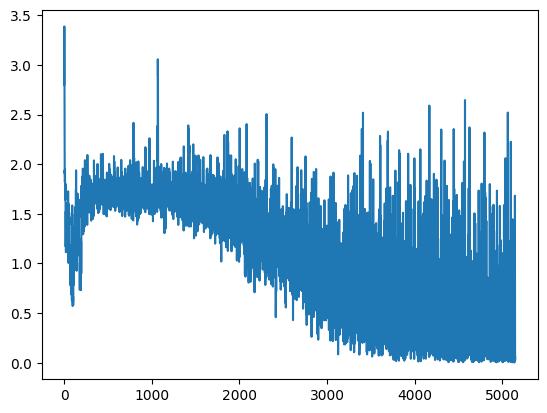

In [45]:
plt.plot(raw_lossesD)

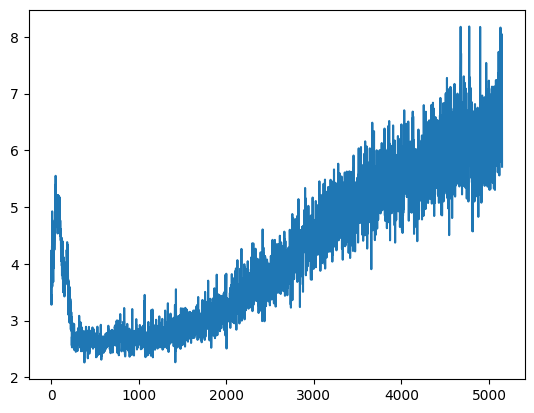

In [46]:
plt.plot(raw_lossesG)

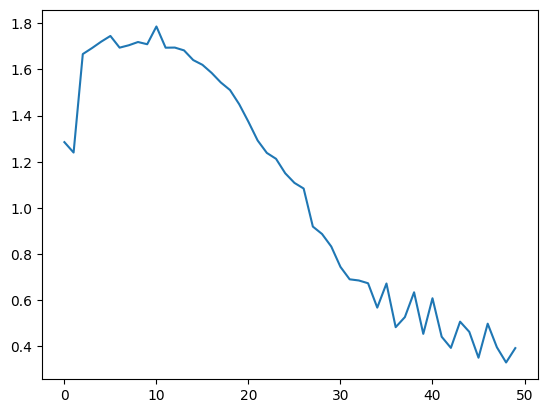

In [47]:
plt.plot(lossesD)

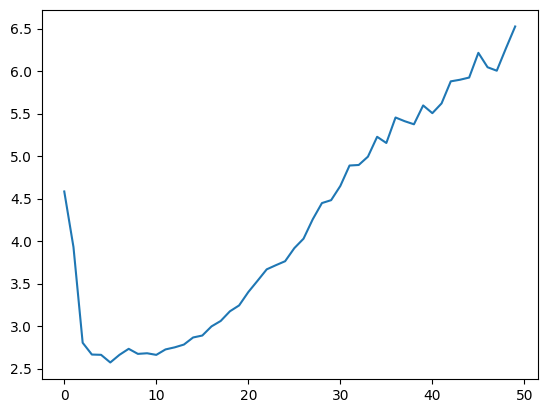

In [48]:
plt.plot(lossesG)

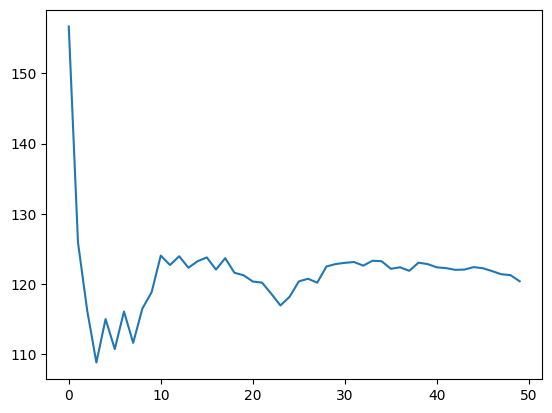

In [49]:
plt.plot(fid_)

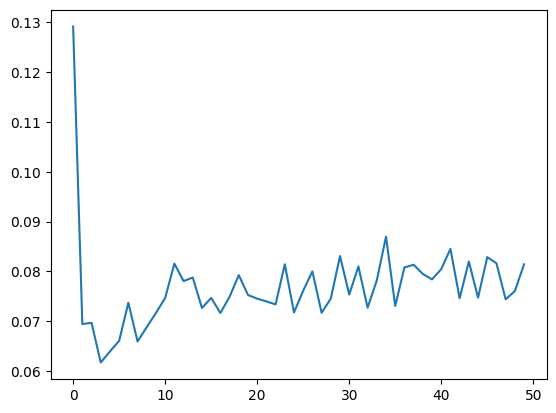

In [50]:
plt.plot(kid_mean_)

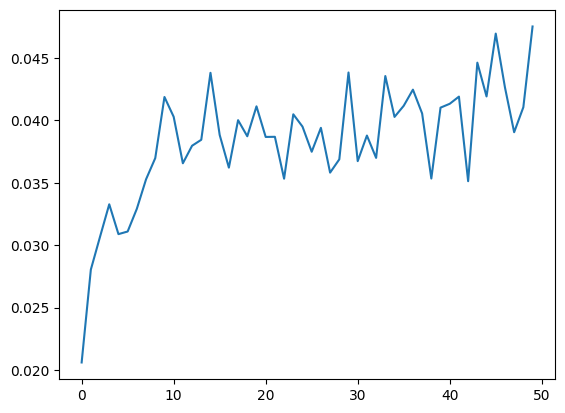

In [51]:
plt.plot(kid_std_)

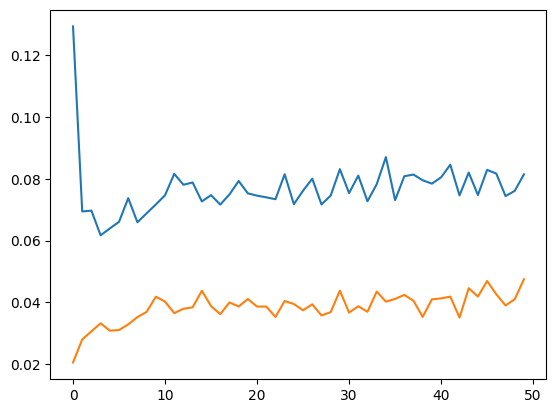

In [52]:
plt.plot(kid_score)

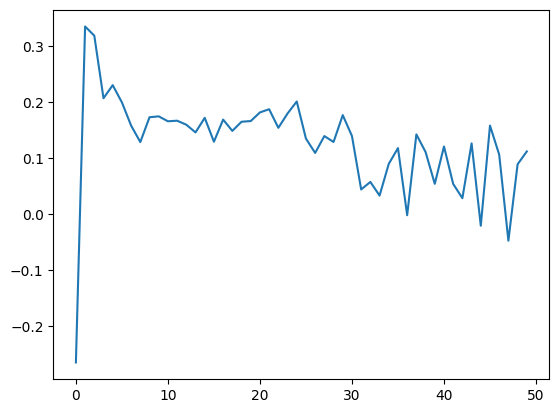

In [53]:
plt.plot(d_equality)

In [54]:

import torch
!pip install torcheval


from torcheval.metrics import PeakSignalNoiseRatio
import torch
import torchvision
#from torcheval.metrics import StructuralSimilarity

real_imgs = real_imgs.to(dtype=torch.uint8).cpu()
fake_imgs = fake_imgs.to(dtype=torch.uint8).cpu()
fid.update(real_imgs, real=True)
fid.update(fake_imgs, real=False)
print(f'fid ',fid.compute())

kid.update(real_imgs, real=True)
kid.update(fake_imgs, real=False)
print(f'kid ',kid.compute())

metric = PeakSignalNoiseRatio()
#input = torch.tensor([[0.1, 0.2], [0.3, 0.4]])
#>>> target = input * 0.9
metric.update(fake_imgs,real_imgs)
print(f'PSNR',metric.compute())#高いほどいい
#PSNR (Peak Signal-to-Noise Ratio): PSNRは、生成画像と本物の画像の間のノイズの量を測定します。高いPSNRは、より低いノイズレベルを示します。

import torch
from skimage.metrics import structural_similarity as ssim
import numpy as np

# 例えば、real_imageが与えられているとします
real_image =real_imgs # 仮のランダムな画像データ
fake_image =fake_imgs
# PyTorch TensorをNumPy配列に変換
real_image_np = real_image.cpu().numpy()

# SSIMを計算するために、0から1の範囲に正規化することが推奨されます
real_image_np = np.clip((real_image_np + 1) / 2.0, 0, 1)

# PyTorch TensorをNumPy配列に変換
fake_image_np = fake_image.cpu().numpy()

# SSIMを計算するために、0から1の範囲に正規化することが推奨されます
fake_image_np = np.clip((fake_image_np + 1) / 2.0, 0, 1)

# SSIMを計算
ssim_value = ssim(real_image_np[0], fake_image_np[0], win_size=3)
print(f"SSIM値: {ssim_value}")
#SSIMは、画像の品質を評価するための指標であり、生成画像と本物の画像の構造的な類似性を測定します。1に近い値が高い品質を示します。

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.2/179.2 kB 3.6 MB/s eta 0:00:00
fid  tensor(119.5573)
kid  (tensor(0.0742), tensor(0.0417))
PSNR tensor(75.2135)
SSIM値: 0.9871413388276754
